# Disclaimer
This practical work does not have as objective to create a working fruit classifier on fruit images. It would be very optimistic to hope that k-means would work on raw images. The goal is to introduce the student to k-means, and some basics of image handling for learning. 


In [1]:
from PIL import Image
import numpy as np 
import os

In [2]:
LARGE_SIZE = 100
SMALL_SIZE = 10

In [3]:
# increase the maximum number of open files so that we can open all the images
import resource
resource.setrlimit(resource.RLIMIT_NOFILE, (10000, 10000))


In [4]:
# read an image with pillow, print its size, rotate it by 45 degrees and redisplay it's size
f = os.listdir("fruits")[0]
print(f)
im = Image.open(os.path.join("fruits", f))
print(im.size)
im = im.rotate(45)
print(im.size)

dQiPD7GWGd.jpeg
(183, 275)
(183, 275)


In [5]:
def rescaleSmallImages(im):
    """Make the smallest dimension of an image bigger than LARGE_SIZE"""
    w, h = im.size
    if w < LARGE_SIZE or h < LARGE_SIZE:
        if w < h:
            im = im.resize((LARGE_SIZE, int(LARGE_SIZE*h/w)))
        else:
            im = im.resize((int(LARGE_SIZE*w/h), LARGE_SIZE))
    return im

def resize(im, size=LARGE_SIZE):
    """Resize an image to the given size"""
    im = im.resize((size, size))
    return im

def cropCenter(im, size=LARGE_SIZE):
    """Crop a size x size square from the center"""
    w, h = im.size
    hsize = size/2 
    im = im.crop((w/2-hsize, h/2-hsize, w/2+hsize, h/2+hsize))
    return im


In [6]:
def augmentAndWriteToDisk(filename, inPath = 'fruits', outPath = 'fruits-augmented', extension = 'jpg', size = LARGE_SIZE):
    """use pillow to read an image, augment the data by scaling and rotation the imagee, normalize the images by making them size x size and convert to numpy array"""
    img = Image.open(os.path.join(inPath, filename))
    img = rescaleSmallImages(img)
    
    augmented_images = []

    # augment the data by scaling and rotating the image
    augmented_images.append(img)
    augmented_images.append(img.rotate(90))
    augmented_images.append(img.rotate(180))
    augmented_images.append(img.rotate(270))
    augmented_images.append(img.resize((int(img.size[0] * 1.5), int(img.size[1] * 1.5))))

    normalized_images = []
    for img in augmented_images:
        normalized_images.append(cropCenter(img))
        
    for i, img in enumerate(normalized_images):
        # write the images to the output folder
        img = img.convert("RGB") # some images seem to have an alpha channel, this removes it
        img.save(os.path.join(outPath, '.'.join(filename.split('.')[:-1]) + '-' + str(i) + '.' + extension))


In [7]:
def augmentDir(inPath = 'fruits', outPath = 'fruits-augmented-%d'%LARGE_SIZE, extension = 'jpg'):
    os.makedirs(outPath, exist_ok=True)
    for filename in os.listdir(inPath):
        augmentAndWriteToDisk(filename, inPath, outPath, extension)

In [8]:
augmentDir()

In [11]:
def load_images(path = 'fruits-augmented-%d'%LARGE_SIZE):
    """Load the data from the given path"""
    res = []
    res_small = []
    for filename in os.listdir(path):
        img = Image.open(os.path.join(path, filename))
        res.append(np.array(img))
        res_small.append(np.array(resize(img, SMALL_SIZE)))
    return np.array(res), np.array(res_small)

In [12]:
data_large, data_small = load_images()

In [13]:
print(data_large.shape)
print(data_small.shape)

(50000, 100, 100, 3)
(50000, 10, 10, 3)


In [25]:
data_small_flat_images = data_small.reshape(-1, SMALL_SIZE*SMALL_SIZE*3) # reshape data to have each image as a row vector
print(data_small_flat_images.shape)

(50000, 300)


In [15]:
# use kmaean to cluster the images into 10 clusters
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=10, random_state=0).fit(
    data_small_flat_images
    ) 

/home/name/.pyenv/versions/3.11.6/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [21]:
import matplotlib.pyplot as plt
def display_images(images):
    """Display the first n images with their labels"""
    plt.figure(figsize=(20, 2))
    for j in range(len(images)):
        plt.subplot(1, len(images), j+1)
        plt.imshow(images[j])
    plt.show()

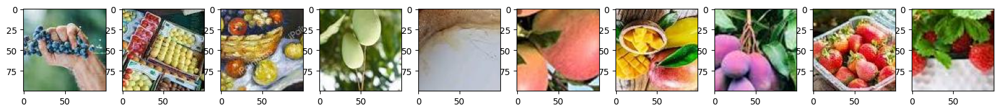

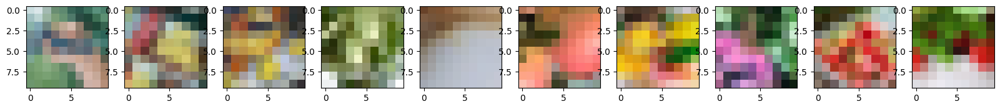

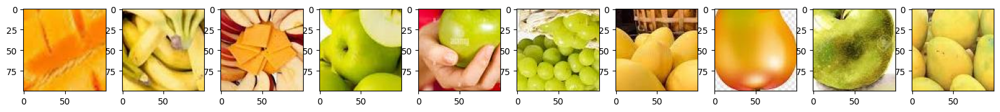

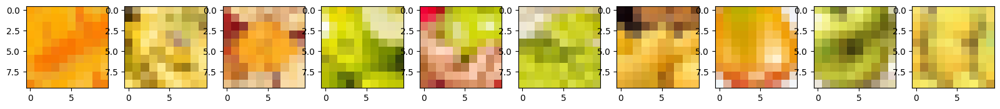

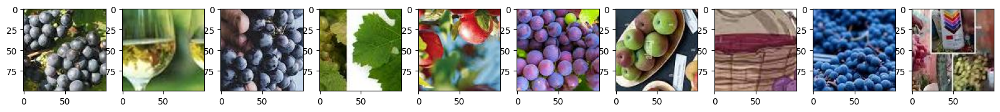

...

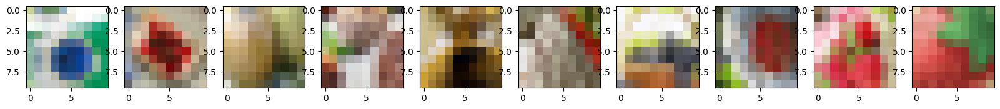

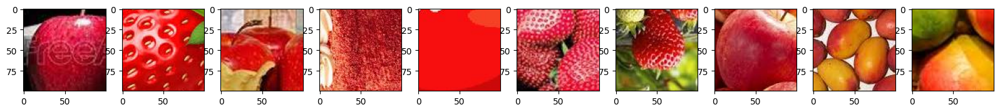

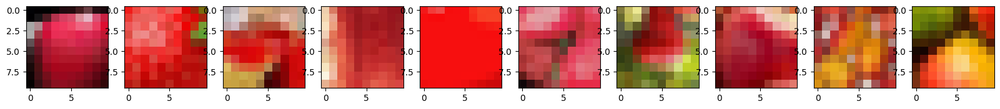

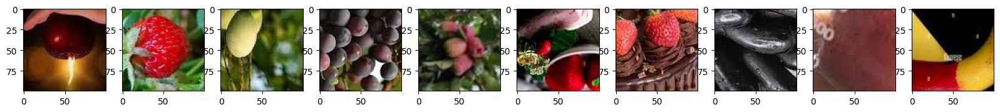

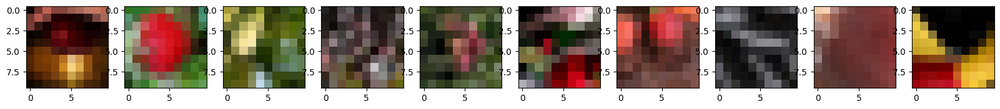

In [22]:
# display 10 first images from each cluster
for i in range(10):
    display_images(data_large[kmeans.labels_ == i][:10])
    display_images(data_small[kmeans.labels_ == i][:10])

In [23]:
# use inertia to evaluatie the quality of the clustering
print(kmeans.inertia_)

36934601559.70104


/home/name/.pyenv/versions/3.11.6/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/name/.pyenv/versions/3.11.6/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/name/.pyenv/versions/3.11.6/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/name/.pyenv/versions/3.11.6/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The 

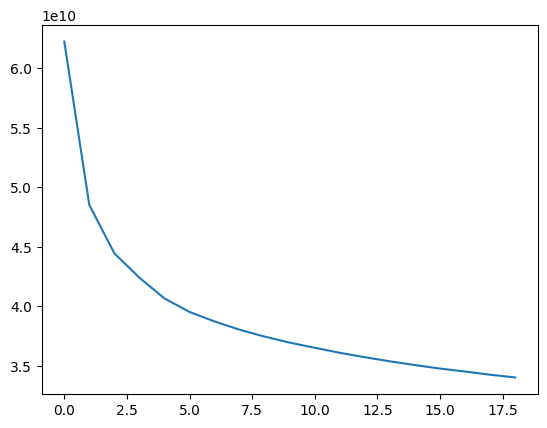

In [26]:
# use inertia to find the best number of clusters
inertia = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(data_small_flat_images)
    inertia.append(kmeans.inertia_)
plt.plot(inertia)
plt.show()

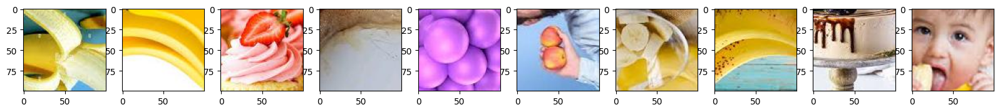

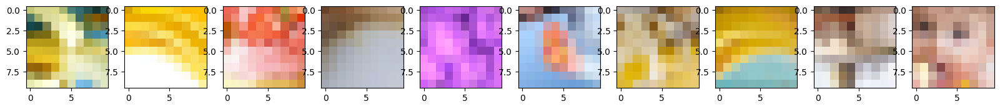

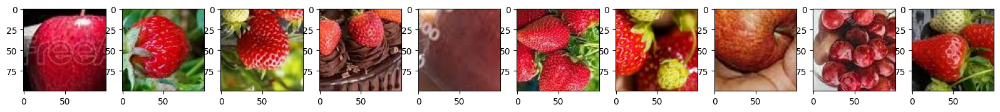

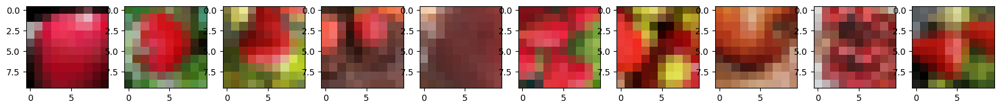

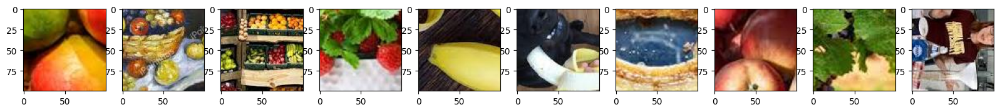

...

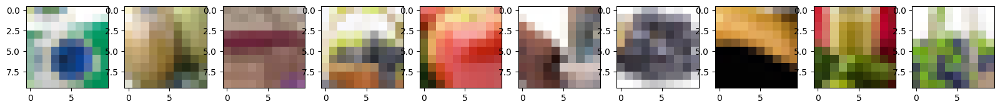

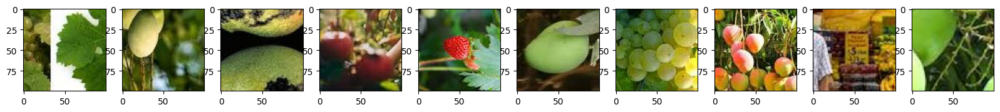

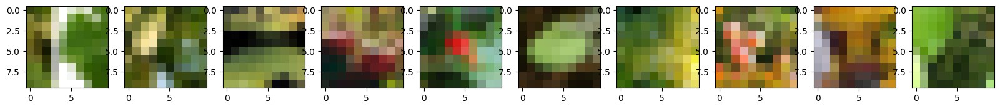

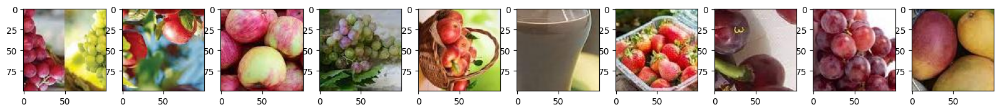

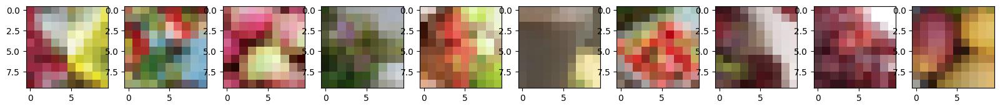

<Figure size 2000x200 with 0 Axes>

<Figure size 2000x200 with 0 Axes>

In [27]:
# display 10 first images from each cluster for data with 20 clusters
for i in range(20):
    display_images(data_large[kmeans.labels_ == i][:10])
    display_images(data_small[kmeans.labels_ == i][:10])